UNDER CONSTRUCTION / TRANSLATION. Adopted and modified from the example in the intro lecture in ELMED219 (in Norwegian) by A.S. Lundervold

# Building a Flower Classifier using Fast.ai (requiring the `fastai` kernel)
 with ResNet34  (could try ResNet18)
 
 **Must be run with the fastai kernel**

### How to install a `fastai` environment with a FASTAI kernel (a GPU is recommended)

Installation and the conda virtual environment It's highly recommended you install fastai and its dependencies in a virtual environment (conda or others), so that you don't interfere with system-wide python packages.

Deactivate any activated environments:

`conda deactivate`

To list all discoverable environments:

`conda info --envs`

To define the fastai environment:

`conda create --name fastai python=3.7`

To activate the fastai environment:

`conda activate fastai`

To install and update fastai with GPU only (**not recommended**):

> `conda install pytorch torchvision cudatoolkit=10.1 -c pytorch`<br>
> `conda install -c fastai fastai`

To install and update fastai with CPU / GPU:

`conda install -c pytorch -c fastai fastai`


To install a Jupyter kernel

`conda install -n fastai ipykernel`<br>
`python -m ipykernel install --user --name fastai --display-name "FASTAI"`

Installing `ipywidgets` is needed by fastai

`conda install -c conda-forge ipywidgets`

https://www.kaggle.com/alxmamaev/flowers-recognition/data

https://medium.com/analytics-vidhya/building-a-flower-classifier-using-fast-ai-a815f9b25a04

https://www.kaggle.com/liuyd2018/planet-multi-label-image-classification

<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Setup" data-toc-modified-id="Setup-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Setup</a></span></li><li><span><a href="#Forbered-data" data-toc-modified-id="Forbered-data-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Forbered data</a></span></li><li><span><a href="#Velg-modell" data-toc-modified-id="Velg-modell-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Velg modell</a></span></li><li><span><a href="#Tren-modell" data-toc-modified-id="Tren-modell-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Tren modell</a></span></li><li><span><a href="#Inspiser-resultater" data-toc-modified-id="Inspiser-resultater-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Inspiser resultater</a></span></li><li><span><a href="#Diskusjon" data-toc-modified-id="Diskusjon-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Diskusjon</a></span><ul class="toc-item"><li><span><a href="#Heatmap" data-toc-modified-id="Heatmap-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>Heatmap</a></span></li><li><span><a href="#Problem-1" data-toc-modified-id="Problem-1-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Problem 1</a></span></li><li><span><a href="#Problem-2" data-toc-modified-id="Problem-2-6.3"><span class="toc-item-num">6.3&nbsp;&nbsp;</span>Problem 2</a></span></li><li><span><a href="#Mer-om-utfordringer-i-deep-learning-fredag-17.-januar" data-toc-modified-id="Mer-om-utfordringer-i-deep-learning-fredag-17.-januar-6.4"><span class="toc-item-num">6.4&nbsp;&nbsp;</span><em>Mer om utfordringer i deep learning fredag 17. januar</em></a></span></li></ul></li><li><span><a href="#Ekstra" data-toc-modified-id="Ekstra-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>Ekstra</a></span></li></ul></div>

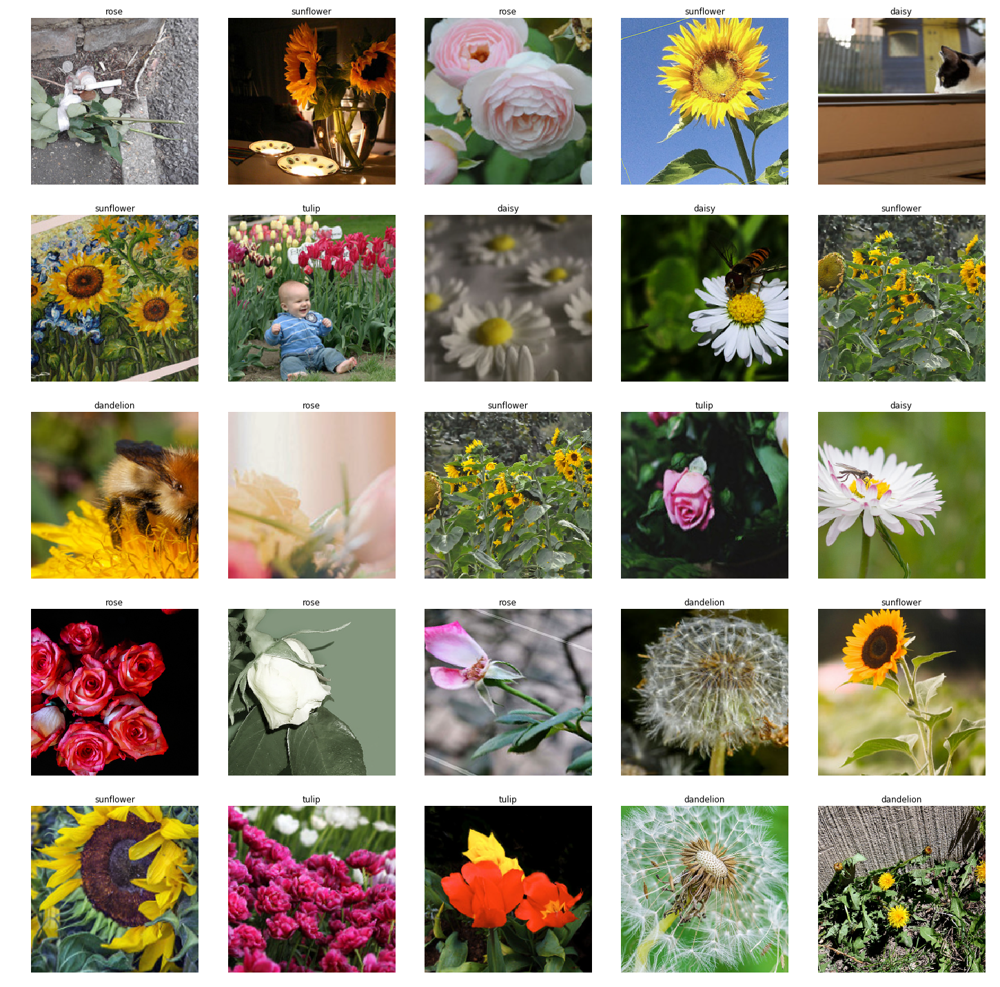

In [1]:
import IPython
IPython.display.Image('assets/flowers.png', width="60%")

# Setup

In [2]:
from fastai.vision import *

In [3]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

Check details of the `fastai` enviroment

In [4]:
import fastai.utils.collect_env; 
fastai.utils.collect_env.show_install(1)



```text
=== Software === 
python        : 3.7.6
fastai        : 1.0.60
fastprogress  : 0.2.2
torch         : 1.4.0
nvidia driver : 440.33
torch cuda    : 10.1 / is available
torch cudnn   : 7603 / is enabled

=== Hardware === 
nvidia gpus   : 2
torch devices : 2
  - gpu0      : 12058MB | TITAN V
  - gpu1      : 12066MB | TITAN V

=== Environment === 
platform      : Linux-4.15.0-74-generic-x86_64-with-debian-buster-sid
distro        : #84-Ubuntu SMP Thu Dec 19 08:06:28 UTC 2019
conda env     : bmed360v2020
python        : /home/arvid/anaconda3/envs/fastai/bin/python
sys.path      : /home/arvid/media/GitHub/BMED360-2020/extra
/home/arvid/anaconda3/envs/fastai/lib/python37.zip
/home/arvid/anaconda3/envs/fastai/lib/python3.7
/home/arvid/anaconda3/envs/fastai/lib/python3.7/lib-dynload

/home/arvid/anaconda3/envs/fastai/lib/python3.7/site-packages
/home/arvid/anaconda3/envs/fastai/lib/python3.7/site-packages/IPython/extensions
/home/arvid/.ipython

Mon Feb 10 16:32:34 2020       
+-------

# Prepare data

OLD: Downloaded to  `/media/data/prj/Fastai/data/flowers-recognition.zip` from [here](https://www.kaggle.com/alxmamaev/flowers-recognition/data)

Downloaded to  `~/prj/Fastai/data/flowers-recognition.zip` from [here](https://www.kaggle.com/alxmamaev/flowers-recognition/data)

*Uncomment the following cells if not data are in place*

```
!unzip -o /media/data/prj/Fastai/data/flowers-recognition.zip -d /media/data/prj/Fastai/data # -o overwrite files

```
```
Archive:  /media/data/prj/Fastai/data/flowers-recognition.zip
  inflating: /media/data/prj/Fastai/data/flowers/daisy/100080576_f52e8ee070_n.jpg  
  inflating: /media/data/prj/Fastai/data/flowers/daisy/10140303196_b88d3d6cec.jpg  
  inflating: /media/data/prj/Fastai/data/flowers/daisy/10172379554_b296050f82_n.jpg  
  inflating: /media/data/prj/Fastai/data/flowers/daisy/10172567486_2748826a8b.jpg
```

In [5]:
# !unzip -o ~/prj/Fastai/data/flowers-recognition.zip -d ~/prj/Fastai/data

In [6]:
# !mv ~/prj/Fastai/data/flowers ~/prj/Fastai/data/flowers-kaggle

In [7]:
from pathlib import Path
path = Path('%s/prj/Fastai/data/flowers-kaggle' % str(Path.home()))
print(path.ls())

[PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/train'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/daisy'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/valid'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/dandelion'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/tulip'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/sunflower'), PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/rose')]


## Dividing data into Training and Validation Sets
Since our data is not already segregated into training and validation sets, we are going to divide them on our own using the ‘os’ and ‘shutil’ modules. (Assuming current path of dataset is data/flowers-kaggle)

**This cell should be run only once:**

```shell
%%time
import os
import shutil

#move all images to train folder
!mv ~/prj/Fastai/data/flowers-kaggle/flowers ~/prj/Fastai/data/flowers-kaggle/train


#create validation set folder
!mkdir ~/prj/Fastai/data/flowers-kaggle/valid

#images of each class are present in folders named after the class label
classes = os.listdir(path/'train')
print(classes)

for c in classes['tulip', 'daisy', 'dandelion', 'rose', 'sunflower']
tulip 782
tulip 202
daisy 613
daisy 156
dandelion 861
dandelion 194
rose 624
rose 160
sunflower 562
sunflower 172
CPU times: user 1.84 s, sys: 7.52 s, total: 9.36 s
Wall time: 1min 45s:
    !mkdir ~/prj/Fastai/data/flowers-kaggle/valid/{c}
 
from random import random

#move some images from training set to validation set for each class
for c in classes:
    for img in os.listdir(path/'train'/c):
        if random() < 0.2:
            !mv ~/prj/Fastai/data/flowers-kaggle/train/{c}/{img} ~/prj/Fastai/data/flowers-kaggle/valid/{c}/{img}

#check if your images have moved properly
for c in classes:
    imgs = os.listdir(path/'train'/c)
    print(c, len(imgs))
    imgs = os.listdir(path/'valid'/c)
    print(c, len(imgs))
```

```
['tulip', 'daisy', 'dandelion', 'rose', 'sunflower']
tulip 782
tulip 202
daisy 613
daisy 156
dandelion 861
dandelion 194
rose 624
rose 160
sunflower 562
sunflower 172
CPU times: user 1.84 s, sys: 7.52 s, total: 9.36 s
Wall time: 1min 45s
```

Count files:

In [8]:
!ls ~/prj/Fastai/data/flowers-kaggle/train/daisy/*.jpg -l |grep "^-"|wc -l
!ls ~/prj/Fastai/data/flowers-kaggle/valid/daisy/*.jpg -l |grep "^-"|wc -l

611
158


In [9]:
DATA = Path('%s/prj/Fastai/data/flowers-kaggle' % str(Path.home()))
DATA.ls()

[PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/train'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/daisy'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/valid'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/dandelion'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/tulip'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/sunflower'),
 PosixPath('/home/arvid/prj/Fastai/data/flowers-kaggle/rose')]

> **I prakis: hvordan man trener modeller har mye å si!**

Triks for å få mer treningsdata «gratis»: **Data-augmentering**

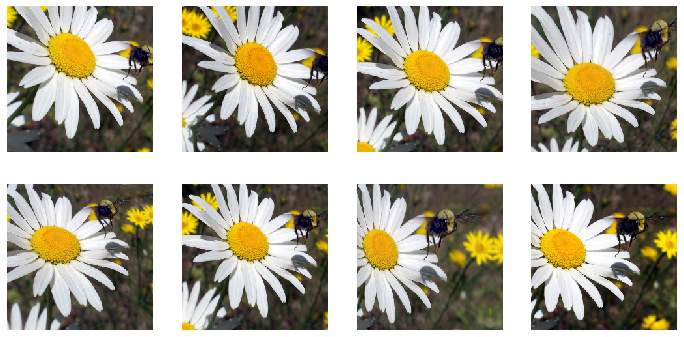

In [10]:
tfms = get_transforms(max_rotate=25)

def plots_f(rows, cols, width, height, **kwargs):
    [get_ex().apply_tfms(tfms[0], **kwargs).show(ax=ax) for i,ax in enumerate(plt.subplots(
        rows,cols,figsize=(width,height))[1].flatten())]

#  Not working for this def get_ex(): return open_image(DATA/'train/daisy/34520699571_f880744f46_n.jpg')

def get_ex(): return open_image(DATA/'train/daisy/413815348_764ae83088.jpg')


plots_f(2, 4, 12, 6, size=224)

In [11]:
data = ImageDataBunch.from_folder(DATA, ds_tfms=tfms, size=224)

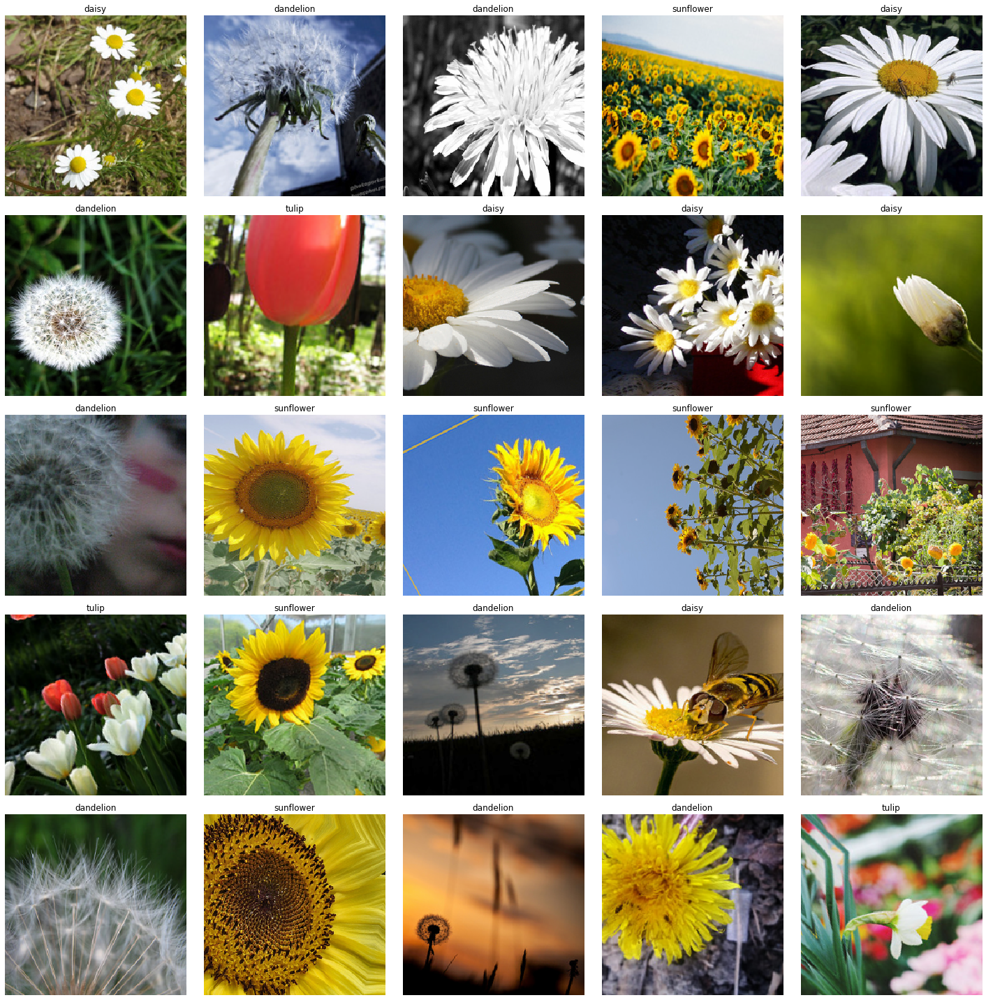

In [12]:
data.show_batch()

# Velg modell

> **I prakis: hvilken modell man bruker har mye å si!**

e.g. [Understanding and visualizing ResNets](https://towardsdatascience.com/understanding-and-visualizing-resnets-442284831be8) and [Neural Network Architectures](https://towardsdatascience.com/neural-network-architectures-156e5bad51ba) and [Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385)

In [13]:
learn = cnn_learner(data, models.resnet34, metrics=accuracy)  

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /home/arvid/.cache/torch/checkpoints/resnet34-333f7ec4.pth


 [ResNet34](https://cv-tricks.com/keras/understand-implement-resnets) has more than  [21 million](http://www.pkumonk.me/2019/02/23/Parameter-size-of-different-network-architecture-in-torchvision-models) trainable parameters to learn:

In [14]:
resnet34 = models.resnet34(pretrained=False)
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)
print("resnet34 parameter num: {0}".format(count_parameters(resnet34)))

resnet34 parameter num: 21797672


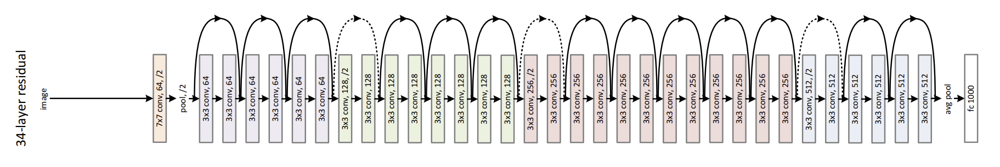

In [15]:
IPython.display.Image('assets/ResNet34.png', width="100%")

From: He et al. @ microsoft.com [[ref](https://arxiv.org/pdf/1512.03385.pdf)]

# Tren modell

> **I prakis: hvordan man trener modeller har mye å si!**

In [16]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


Min numerical gradient: 1.45E-03
Min loss divided by 10: 1.20E-02


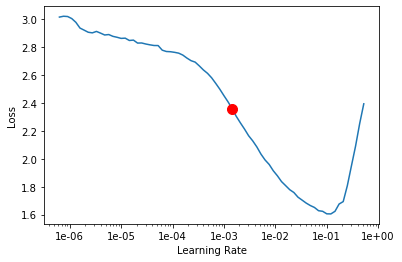

In [53]:
learn.recorder.plot(suggestion=True)

In [17]:
learn.freeze()
learn.fit(1, lr=1e-3)

epoch,train_loss,valid_loss,accuracy,time
0,0.745237,0.346157,0.887719,00:11


In [55]:
learn.unfreeze()

In [18]:
learn.fit_one_cycle(4, max_lr=1e-4)

epoch,train_loss,valid_loss,accuracy,time
0,0.443168,0.328698,0.899415,00:10
1,0.420861,0.314375,0.897076,00:10
2,0.427349,0.310531,0.898246,00:10
3,0.409212,0.303644,0.902924,00:10


Let’s plot the learning curves:

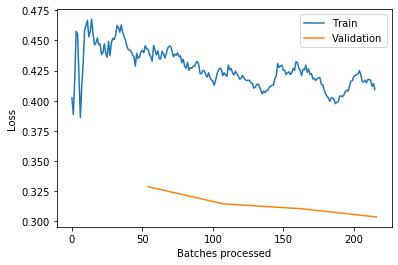

In [19]:
learn.recorder.plot_losses()

# Inspiser resultater

Her er en rekke bilder modellen aldri har sett før: 

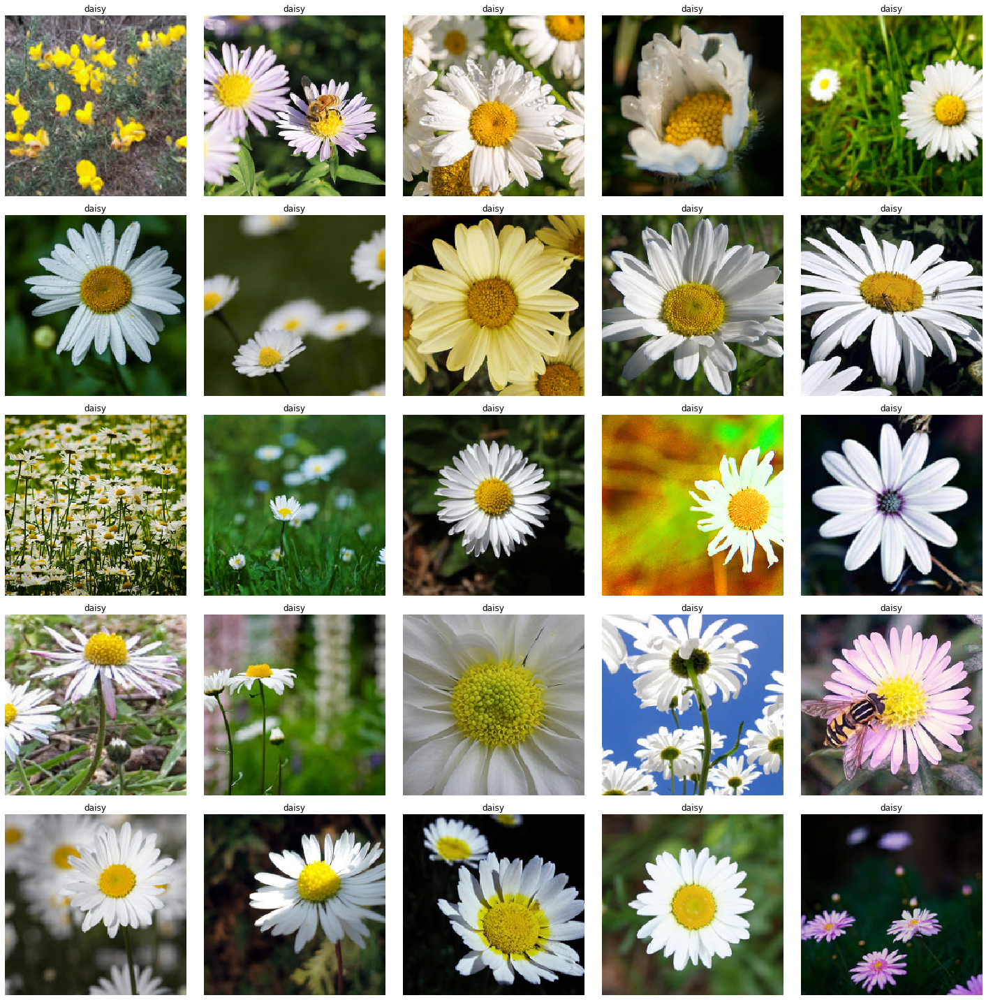

In [20]:
data.show_batch(ds_type=2)

Her er noen av modellens prediksjoner på disse:

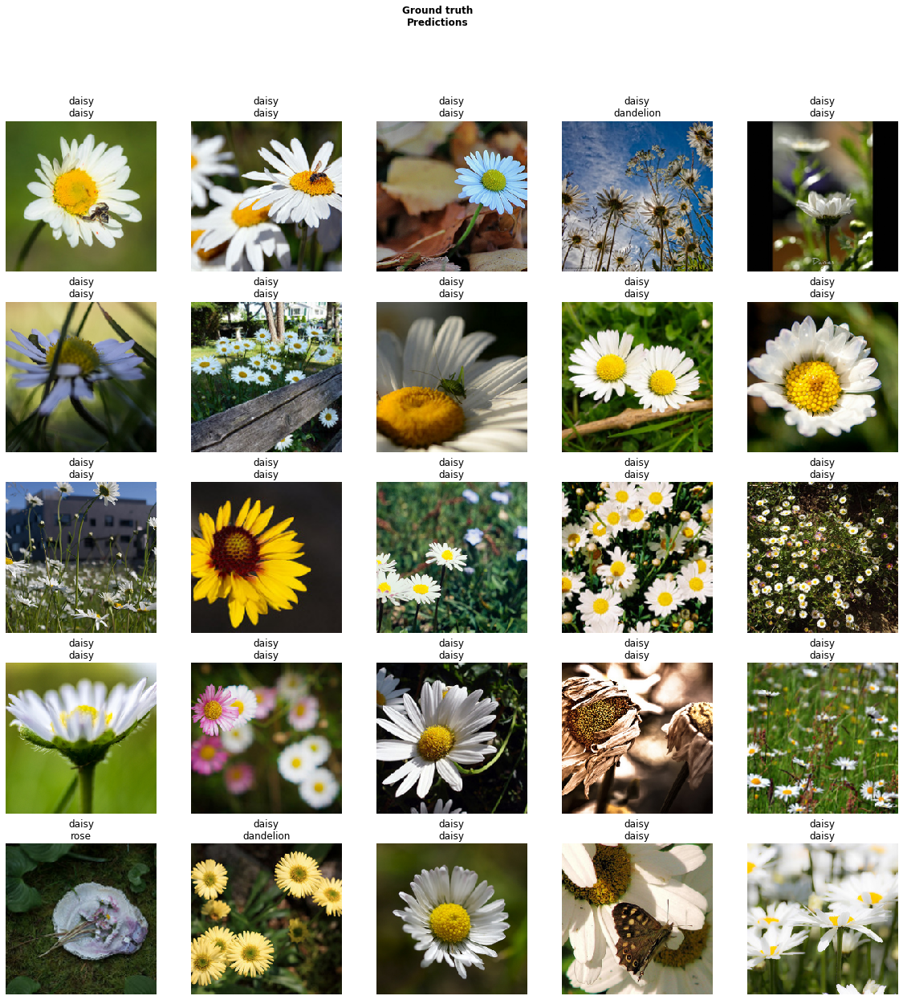

In [21]:
learn.show_results()

Hvor godt gjorde den det?

In [22]:
interp = ClassificationInterpretation.from_learner(learn)

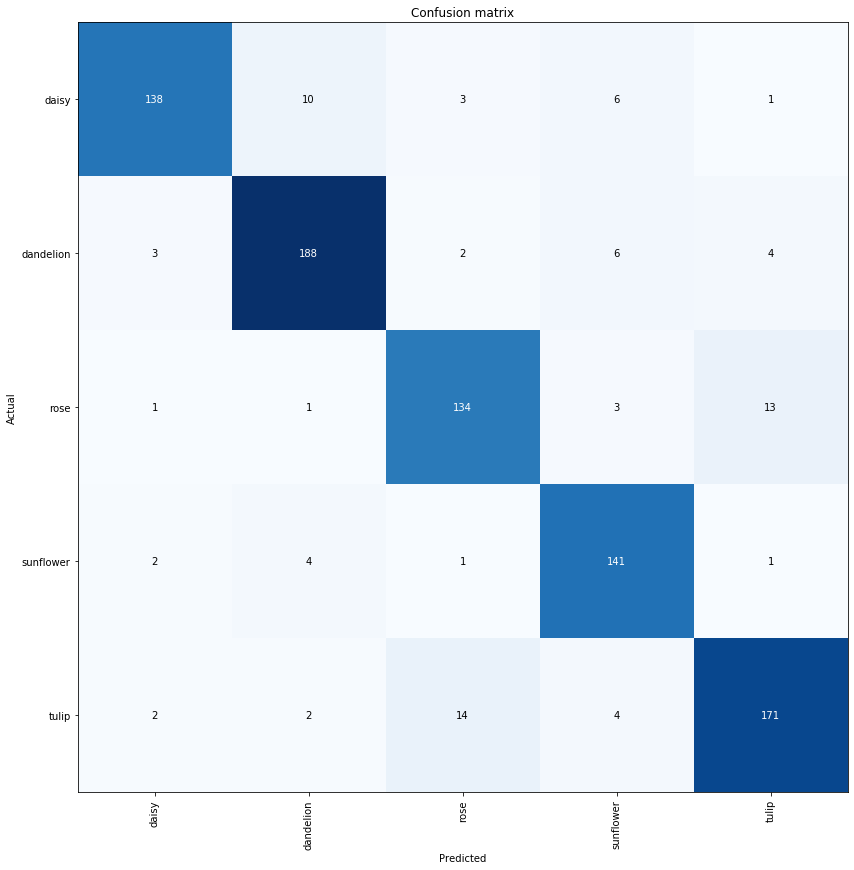

In [23]:
interp.plot_confusion_matrix(figsize=(12,12))

Hva med bildene den bommet på?

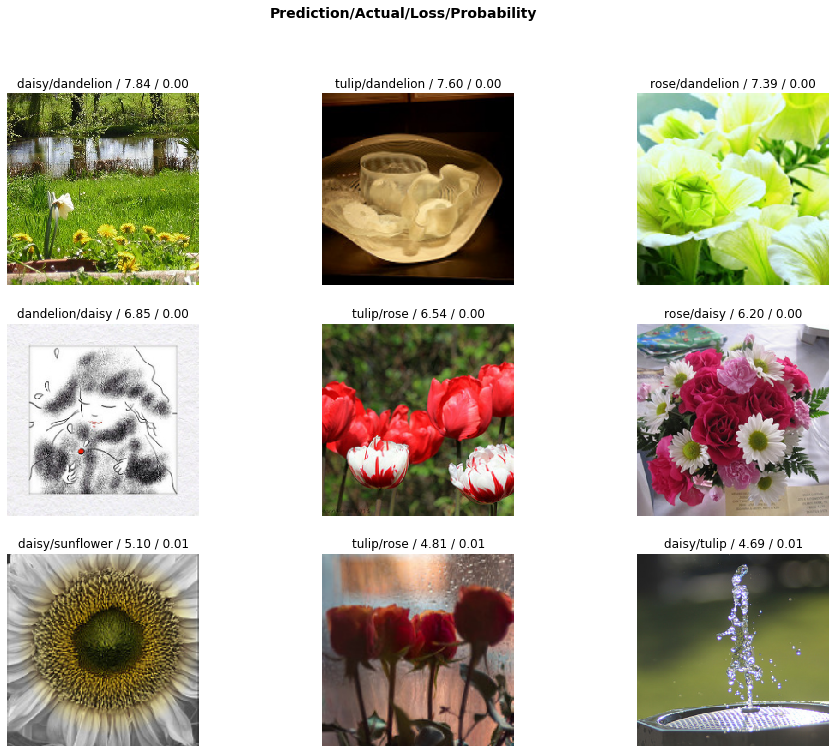

In [24]:
interp.plot_top_losses(9, figsize=(16,12), heatmap=False)

Kan vi forstå hvorfor den bommet på disse? Hva var det modellen fokuserte på? (*Explainable AI*)

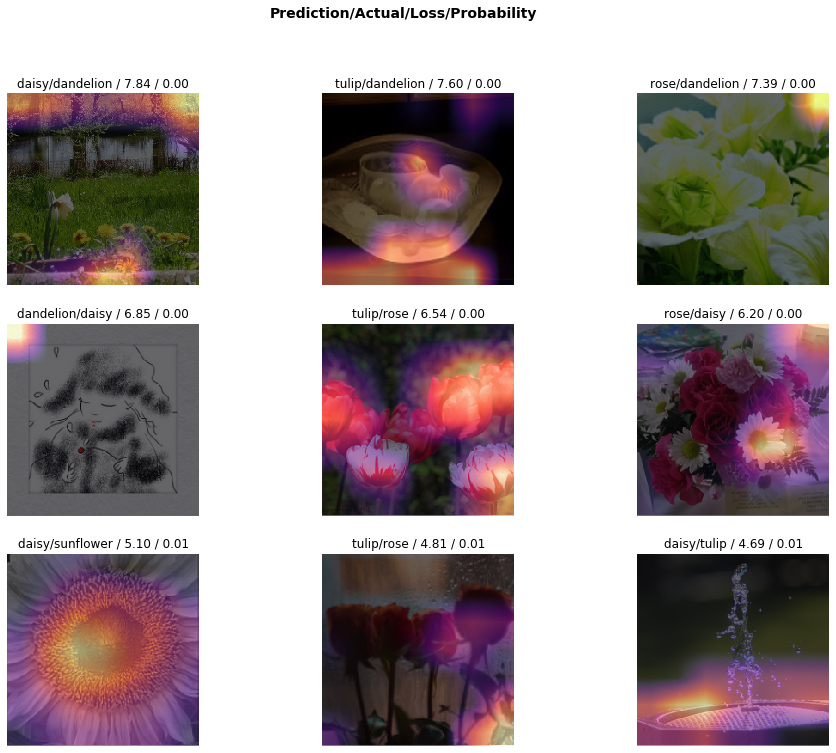

In [25]:
interp.plot_top_losses(9, figsize=(16,12), heatmap=True)

# Diskusjon

## Heatmap

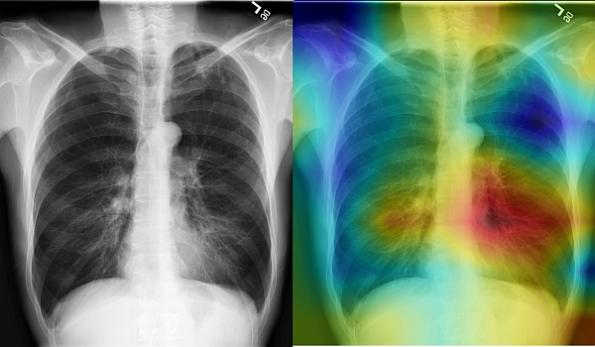

In [26]:
IPython.display.Image('assets/xray_good.jpg', width="60%")

## Problem 1

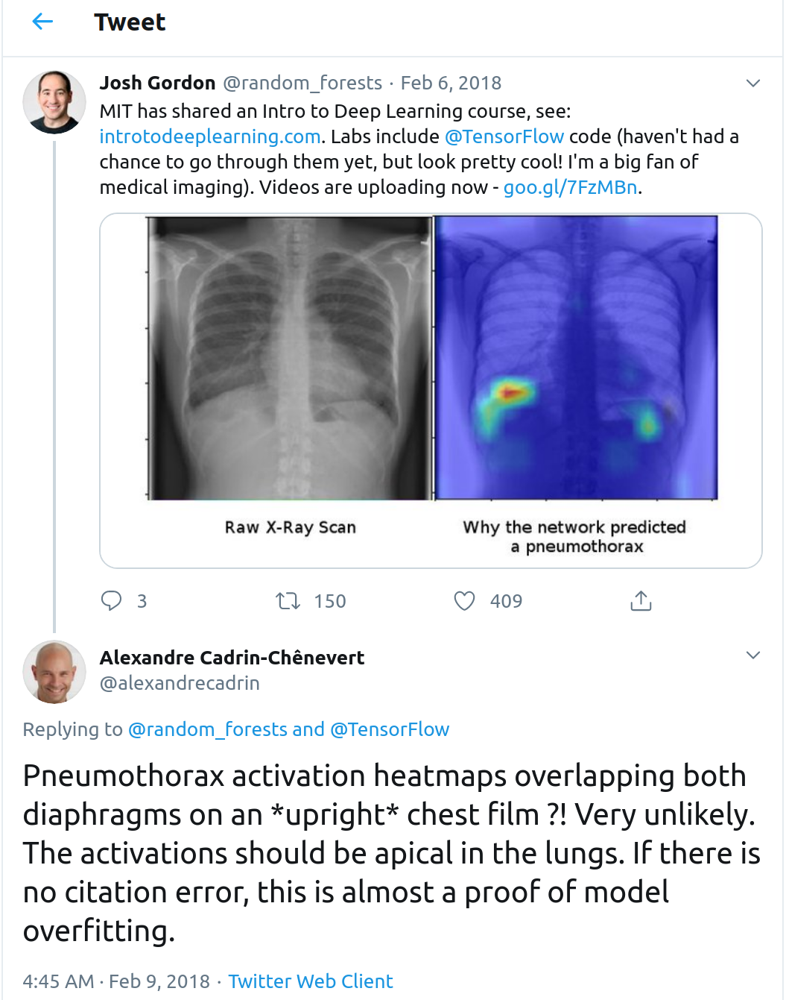

In [27]:
IPython.display.Image('assets/xray-pneumo-mistake.png', width="60%")

## Problem 2

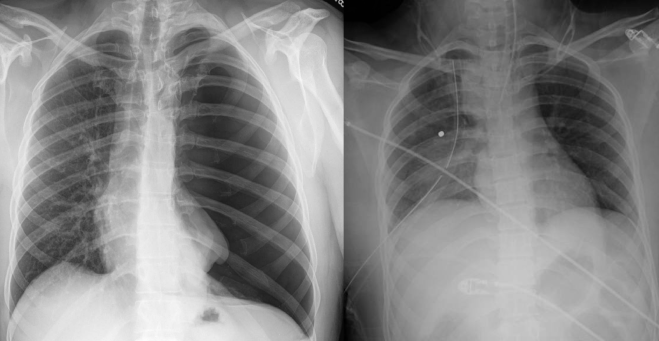

In [28]:
IPython.display.Image('assets/pneumo_safe_vs_critical.png', width="60%")

## *Mer om utfordringer i deep learning fredag 17. januar* 

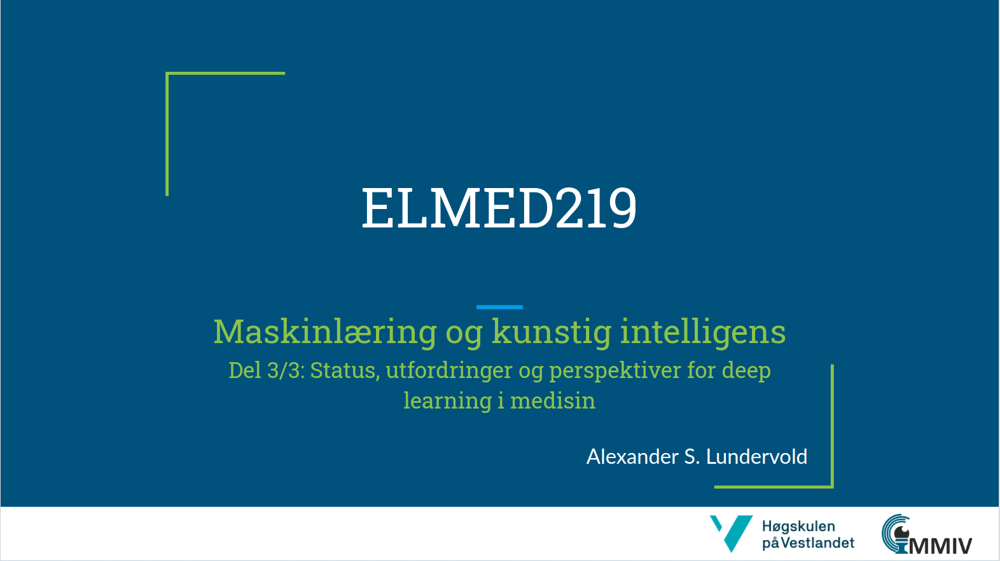

In [29]:
IPython.display.Image('assets/Intro-3-av-3.png', width="80%")

# Ekstra

**Data source:**

`kaggle datasets download -d alxmamaev/flowers-recognition`

`https://www.dropbox.com/s/oq9rbexzfraof1e/flowers-elmed219.zip?dl=1`

## Deep Learning for Diagnosis of Skin Images (*melanoma detection*) with fastai

By [[Aldo von Wangenheim](https://www.inf.ufsc.br/~aldo.vw)] 
**see:** https://towardsdatascience.com/deep-learning-for-diagnosis-of-skin-images-with-fastai-792160ab5495

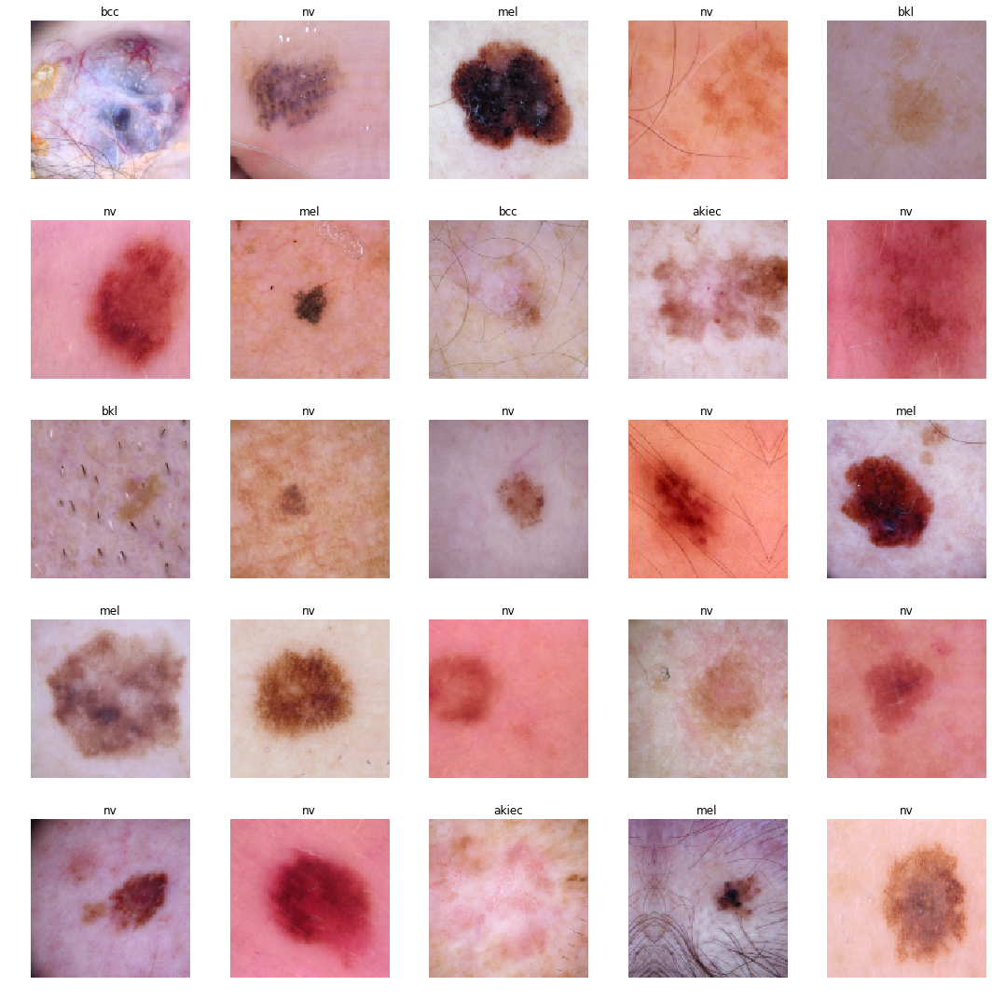

In [30]:
IPython.display.Image('assets/skin_lesions.png', width="80%")